In [1]:
# Sort cells of a particular cell line by height and shape mode 1

In [2]:
!pwd
!date

/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cvapipe_analysis/local_staging_notebooks/Others
Thu Jun  2 10:18:52 PDT 2022


In [3]:
import os
import sys
import importlib
import concurrent
import numpy as np
import pandas as pd
from pathlib import Path
from tqdm.notebook import tqdm
from skimage import io as skio
import matplotlib.pyplot as plt
from aicscytoparam import cytoparam
from sklearn.decomposition import PCA
from aicsshparam import shtools, shparam
from aicsimageio import AICSImage
from aicsimageio.writers import OmeTiffWriter
from cvapipe_analysis.tools import io, viz, general, controller, shapespace, plotting

sys.path.insert(1, '../tools')
import common

In [4]:
path_config = Path("/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cvapipe_analysis/")
config = general.load_config_file(path_config)
control = controller.Controller(config)
print(control.get_staging())

/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cvapipe_analysis/local_staging_variance


In [5]:
device = io.LocalStagingIO(control)
df = device.load_step_manifest("preprocessing")
space = shapespace.ShapeSpace(control)
space.execute(df)

In [6]:
df_sms = pd.concat([df,space.shape_modes], axis=1)
print(df.shape, df_sms.shape)

(202847, 1290) (202847, 1298)


In [7]:
df_sms = df_sms.dropna(subset=["NUC_MEM_PC1"])
print(df_sms.shape)

(175149, 1298)


In [12]:
# Look for cell line with large number of cells and good coverage of shape mode 1
df_rank = []
for gene, df_gene in df_sms.groupby("structure_name"):
    df_rank.append({
        "gene": gene,
        "n": len(df_gene),
        "sm1range": np.ptp(df_gene.NUC_MEM_PC1.values)
    })
df_rank = pd.DataFrame(df_rank)

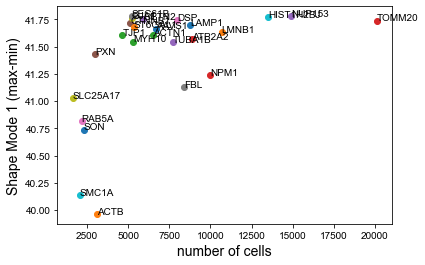

In [18]:
fig, ax = plt.subplots(1,1)
for index, row in df_rank.iterrows():
    ax.scatter(row.n, row.sm1range)
    ax.text(row.n, row.sm1range, s=row.gene)
ax.set_xlabel("number of cells", fontsize=14)
ax.set_ylabel("Shape Mode 1 (max-min)", fontsize=14)
plt.show()

In [19]:
# Let's use TOMM20: good coverage and large number of cells

In [21]:
df_gene = df_sms.loc[df_sms.structure_name=="TOMM20"]
df_gene = df_gene.sort_values(by="NUC_MEM_PC1")

In [22]:
# Let's find indexes equally spaced in the shape mode 1 range

In [28]:
indexes= []
vmin, vmax = df_gene.NUC_MEM_PC1.min(), df_gene.NUC_MEM_PC1.max()
landmarks = np.linspace(vmin, vmax, 100)
for ld in landmarks:
    idx = df_gene.index[np.abs(df_gene.NUC_MEM_PC1.values-ld).argmin()]
    indexes.append(idx)
selection = {"TOMM20": indexes}

In [29]:
%%time
data = common.load_multiple_single_cell_images_fast(
    selection = selection,
    df = df,
    control = control,
    redirect = True,
    alignment = True
)

  0%|          | 0/100 [00:00<?, ?it/s]

CPU times: user 16.9 s, sys: 1min 21s, total: 1min 38s
Wall time: 6min 5s


In [45]:
importlib.reload(common)

<module 'common' from '/allen/aics/assay-dev/MicroscopyOtherData/Viana/projects/cvapipe_analysis/local_staging_notebooks/Others/../tools/common.py'>

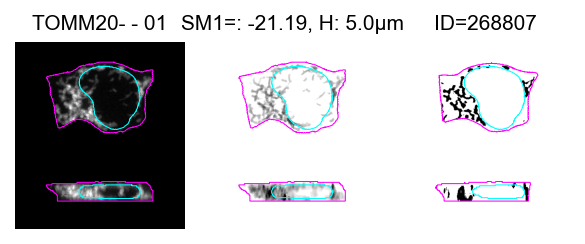

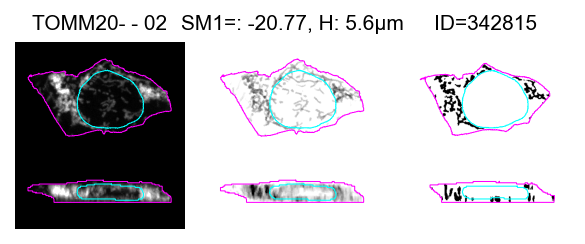

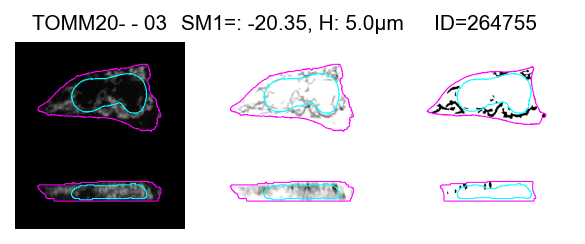

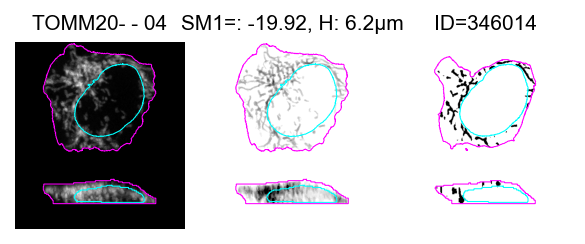

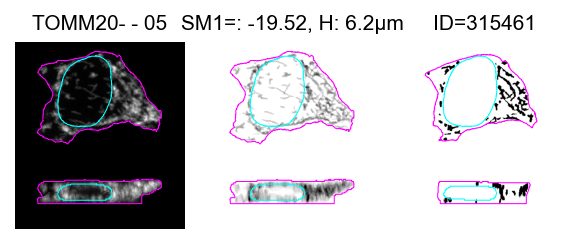

...

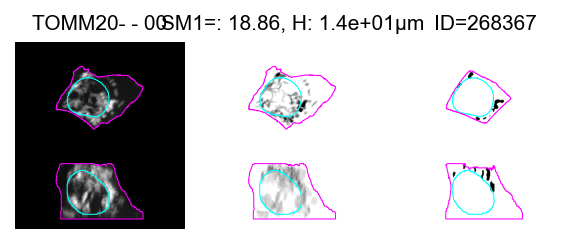

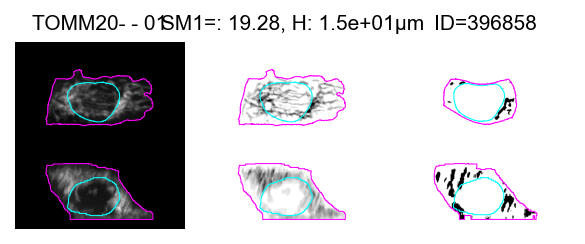

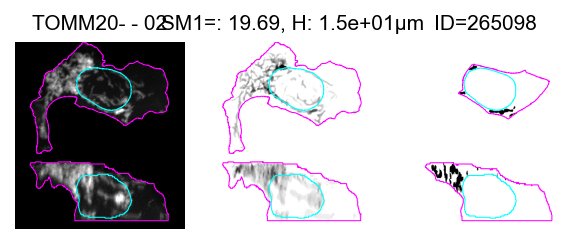

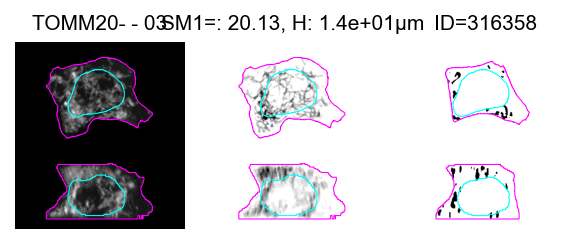

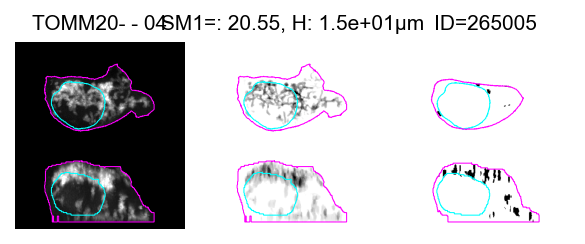

In [48]:
for gene, imgs in data.items():
    allcellsinfo = []
    for idximg, index in zip(imgs, indexes):
        allcellsinfo.append({
            "CellId": index,
            "gene": gene,
            "dataset": "",
            "SM1": f": {df_gene.at[index,'NUC_MEM_PC1']:.2f}, H: {0.108*df_gene.at[index,'MEM_position_depth']:.2}µm",
            "img": idximg["img"]
        })
    stack = common.get_stack_with_single_cell_from_two_populations(allcellsinfo, scale=4, bbox=400, text_label="SM1")
    skio.imsave(f"{gene}-RankedBy-SM1.tif", stack)

In [49]:
# Sort the indexes by height now

In [54]:
order_by_height = df_gene.loc[indexes, "MEM_position_depth"].values.argsort()

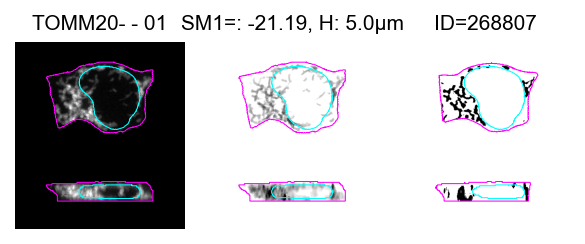

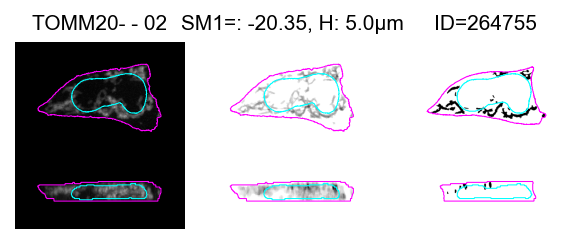

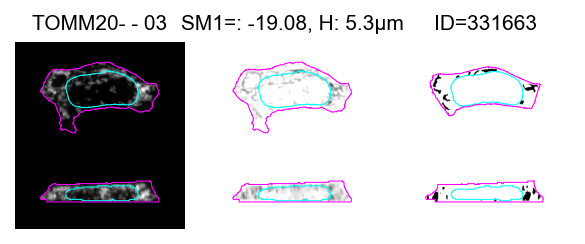

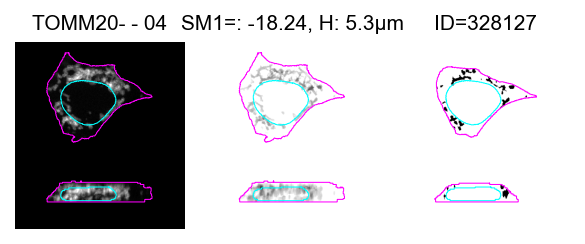

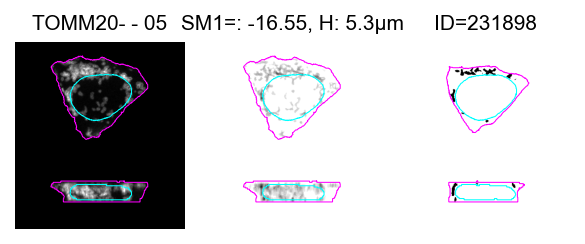

...

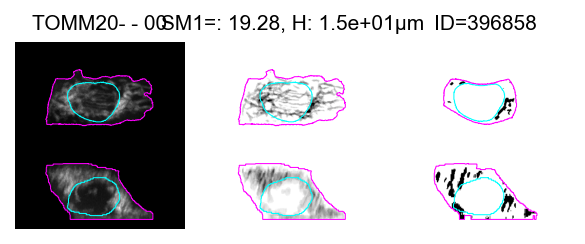

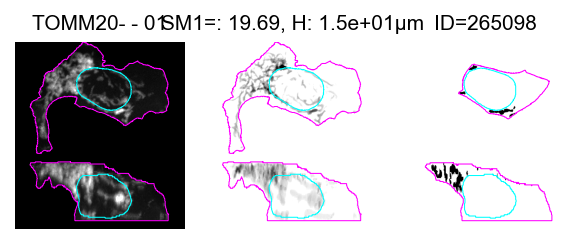

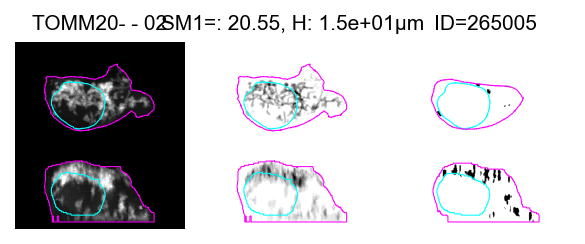

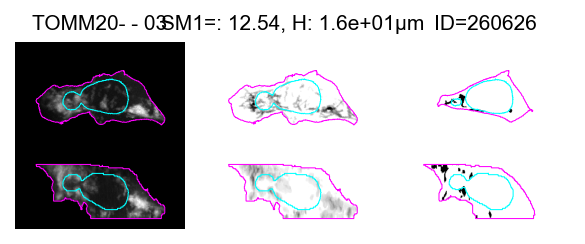

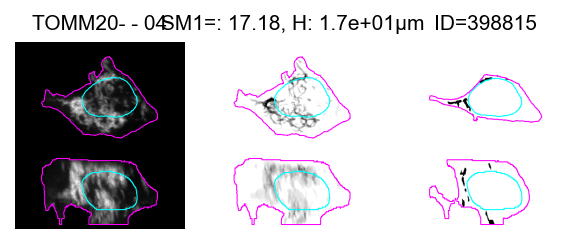

In [58]:
for gene, imgs in data.items():
    allcellsinfo = []
    for loc in order_by_height:
        idximg = imgs[loc]
        index = indexes[loc]
        allcellsinfo.append({
            "CellId": index,
            "gene": gene,
            "dataset": "",
            "SM1": f": {df_gene.at[index,'NUC_MEM_PC1']:.2f}, H: {0.108*df_gene.at[index,'MEM_position_depth']:.2}µm",
            "img": idximg["img"]
        })
    stack = common.get_stack_with_single_cell_from_two_populations(allcellsinfo, scale=4, bbox=400, text_label="SM1")
    skio.imsave(f"{gene}-RankedBy-Height.tif", stack)

In [59]:
common.now("complete.")

complete. 2022-06-02 13:23:59
